In [26]:
from pyAudioAnalysis import ShortTermFeatures as aF
from pyAudioAnalysis import audioBasicIO as aIO 
import numpy as np 
import matplotlib.pyplot as plt
import IPython
import pandas as pd
from pathlib import Path

In [22]:
start = 10
end = 15
total = end-start
genre1 = "country"
genre2 = "classical"
genre3 = "rock"
selected_columns = ['zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread', 'spectral_entropy', 'spectral_flux', 'spectral_rolloff', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5']

In [34]:
# read audio data from file 
# (returns sampling freq and signal as a numpy array)

genre3_df = pd.DataFrame()
sound_folder = f'genres/{genre3}'
csv_folder = Path(f'genres/{genre3}_csv')
csv_folder.mkdir(parents=True, exist_ok=True)

container_3 = np.zeros((68,600), dtype=float)
for i in range(start,end):
    audio_name = f'{genre3}.000' + str(i) 
    music_path_3 = audio_name + ".wav"
    fs_3, s_3 = aIO.read_audio_file(os.path.join(sound_folder, music_path_3))
    print(fs_3, s_3)
    duration = len(s_3) / float(fs_3)
    win, step = 0.050, 0.050
    f_3, fn = aF.feature_extraction(s_3, fs_3, int(fs_3 * win), int(fs_3 * step))
    if f_3.shape != container_3.shape:
        print("f_3.shape", f_3.shape)
        if f_3.shape[1] > container_3.shape[1]:
            f_3 = f_3[:, 0:container_3.shape[1]]
        else:
            a = container_3.shape[0]-f_3.shape[0]
            b = container_3.shape[1]-f_3.shape[1]
            f_3 = np.pad(f_3, 
                [(0,a), (0,b)], mode="constant", constant_values=(0,0))
    
    f3_df = pd.DataFrame(f_3)
    csv_file = audio_name + '.csv'
    f3_df.to_csv(csv_folder/csv_file)
    # genre3_df = genre3_df.append(f3_df, ignore_index=True)
    # container_3 += f_3
# container_3 /= total
# print(genre3_df.head)

22050 [-2461 -2989 -1841 ...  5478  4676  3698]
22050 [-2575 -5370 -3699 ... -1514 -2144 -2181]
22050 [-199  472 1530 ... -230 -648 -935]
22050 [ 2159  3289  2788 ... -1242 -1492 -1413]
22050 [ -558  -953  -928 ... 13639 14345 13662]


In [17]:

print("names", fn)


names ['zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread', 'spectral_entropy', 'spectral_flux', 'spectral_rolloff', 'mfcc_1', 'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8', 'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'chroma_1', 'chroma_2', 'chroma_3', 'chroma_4', 'chroma_5', 'chroma_6', 'chroma_7', 'chroma_8', 'chroma_9', 'chroma_10', 'chroma_11', 'chroma_12', 'chroma_std', 'delta zcr', 'delta energy', 'delta energy_entropy', 'delta spectral_centroid', 'delta spectral_spread', 'delta spectral_entropy', 'delta spectral_flux', 'delta spectral_rolloff', 'delta mfcc_1', 'delta mfcc_2', 'delta mfcc_3', 'delta mfcc_4', 'delta mfcc_5', 'delta mfcc_6', 'delta mfcc_7', 'delta mfcc_8', 'delta mfcc_9', 'delta mfcc_10', 'delta mfcc_11', 'delta mfcc_12', 'delta mfcc_13', 'delta chroma_1', 'delta chroma_2', 'delta chroma_3', 'delta chroma_4', 'delta chroma_5', 'delta chroma_6', 'delta chroma_7', 'delta chroma_8', 'delta chroma_9', 'delta chrom

In [18]:

container_2 = np.zeros((68,600), dtype=float)
for i in range(start,end):
    music_path_2 = f'genres/{genre2}/{genre2}.000' + str(i) + ".wav"
    fs_2, s_2 = aIO.read_audio_file(music_path_2)
    duration= len(s_2) / float(fs_2)
    win, step = 0.050, 0.050
    f_2, fn = aF.feature_extraction(s_2, fs_2, int(fs_2 * win), int(fs_2* step))
    if f_2.shape != container_2.shape:
        print("f_2.shape", f_2.shape)
        if f_2.shape[1] > container_2.shape[1]:
            f_2 = f_2[:, 0:container_2.shape[1]]
        else:
            a = container_2.shape[0]-f_2.shape[0]
            b = container_2.shape[1]-f_2.shape[1]
            f_2 = np.pad(f_2, 
                [(0,a), (0,b)], mode="constant", constant_values=(0,0))
    container_2 += f_2 
container_2 /= total

In [19]:

container_1 = np.zeros((68,600), dtype=float)
for i in range(start, end):
    music_path_1 = f'genres/{genre1}/{genre1}.000' + str(i) + ".wav" 
    fs_1, s_1 = aIO.read_audio_file(music_path_1)
    duration= len(s_1) / float(fs_1)
    win, step = 0.050, 0.050
    f_1, fn = aF.feature_extraction(s_1, fs_1, int(fs_1 * win), int(fs_1* step))

    if f_1.shape != container_1.shape:
        print("f_1.shape", f_1.shape)
        if f_1.shape[1] > container_1.shape[1]:
            f_1 = f_1[:, 0:container_1.shape[1]]
        else:
            a = container_1.shape[0]-f_1.shape[0]
            b = container_1.shape[1]-f_1.shape[1]
            f_1 = np.pad(f_1, 
                [(0,a), (0,b)], mode="constant", constant_values=(0,0))
    container_1 += f_1 
container_1 /= total

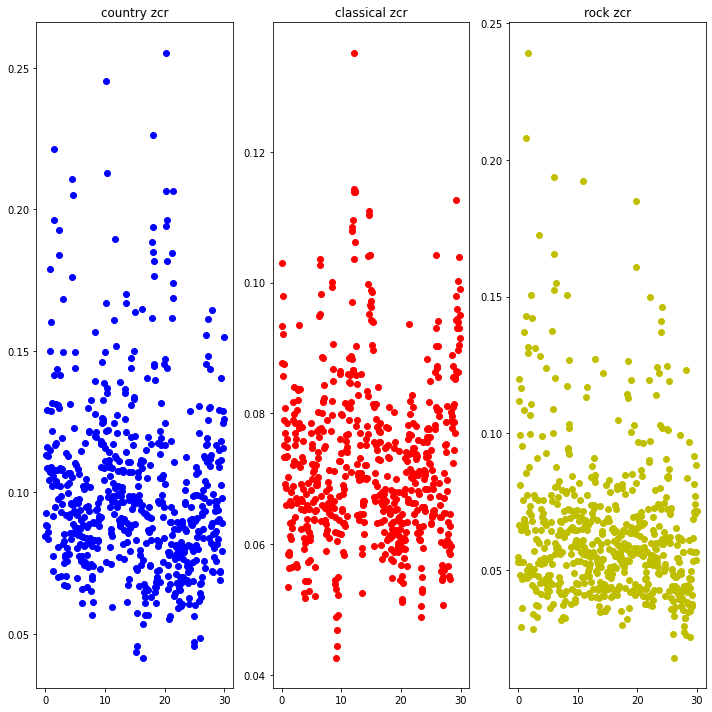

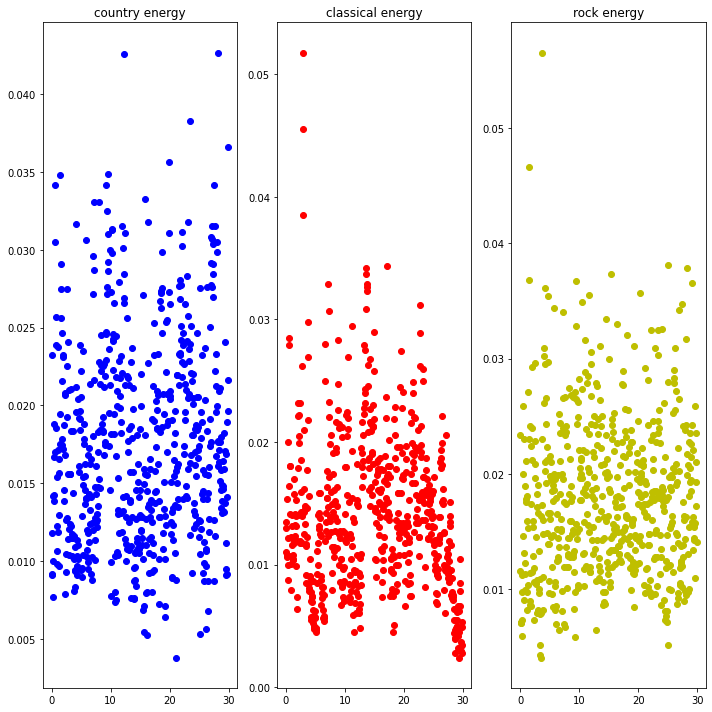

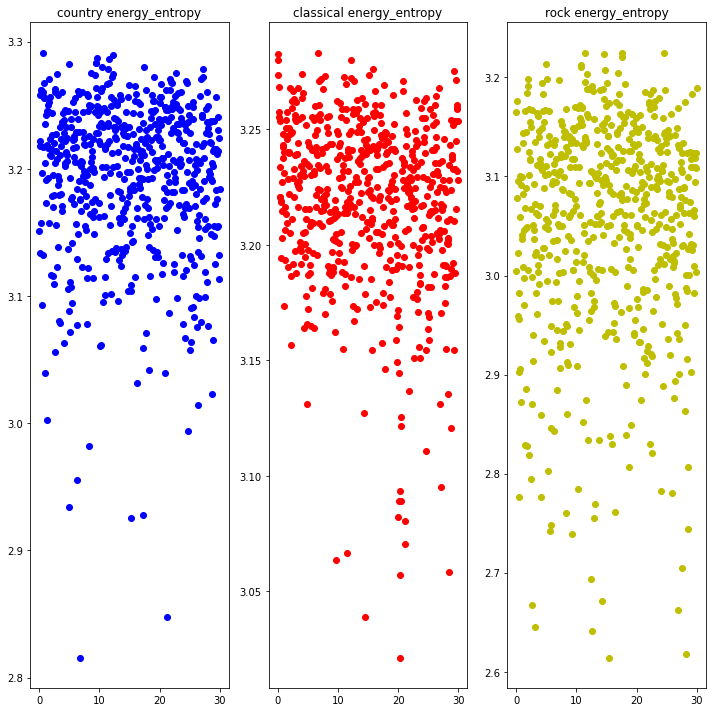

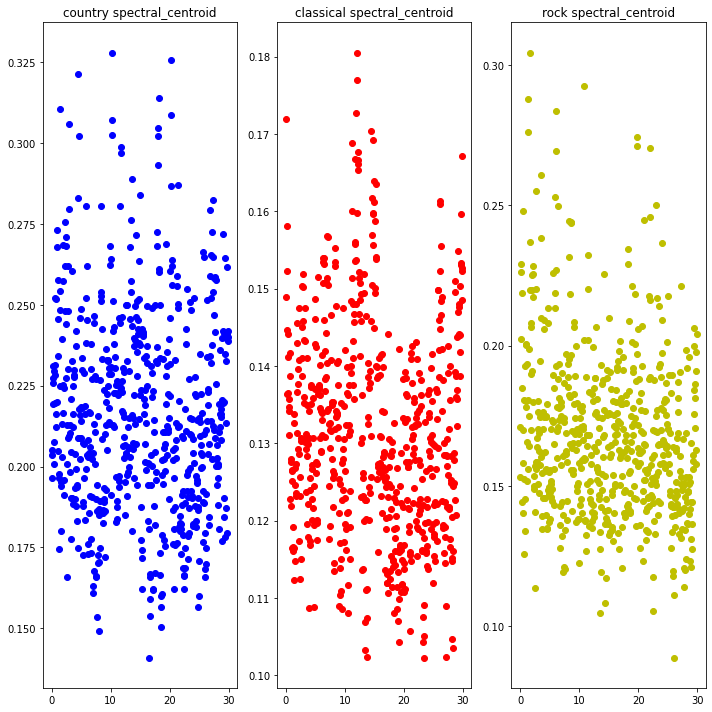

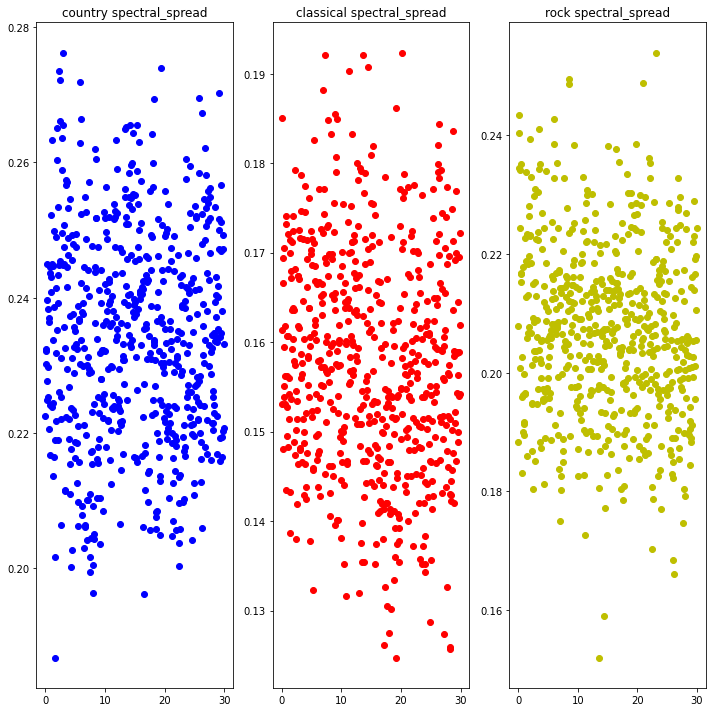

...

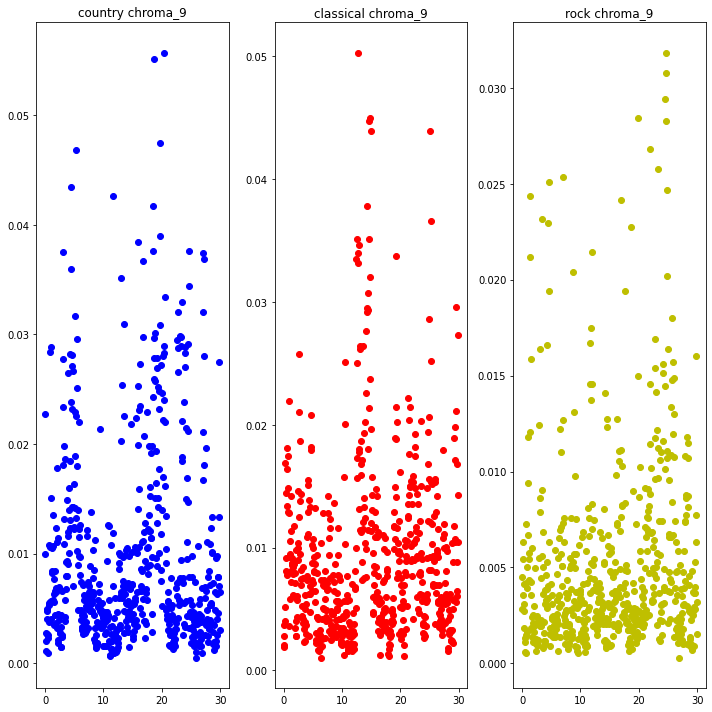

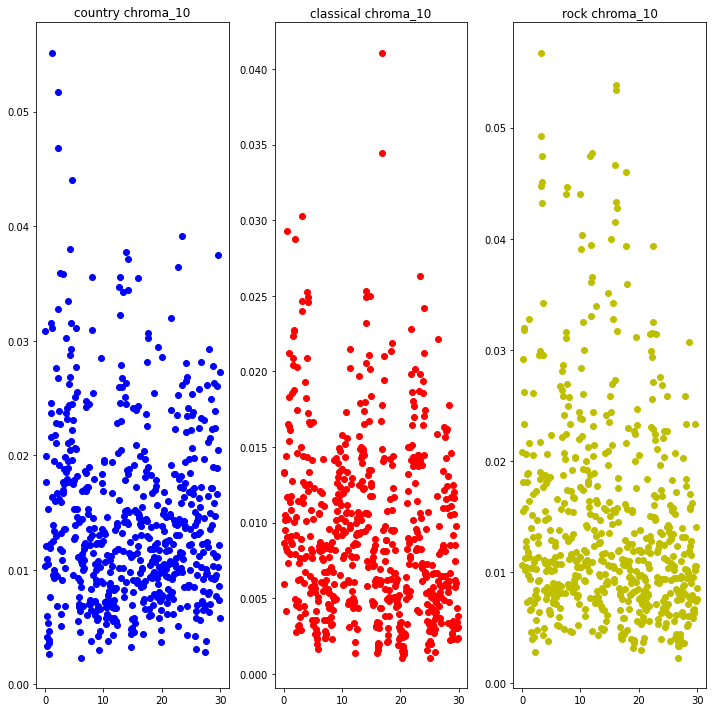

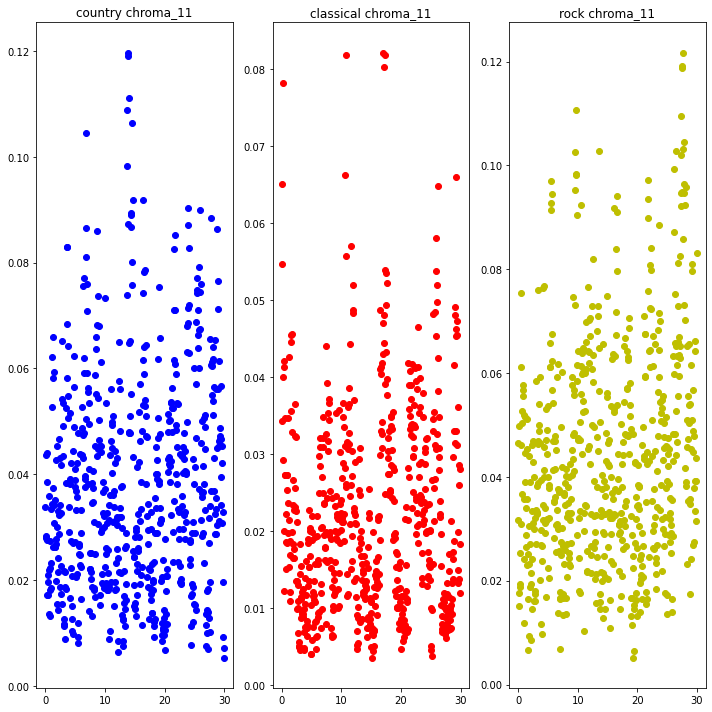

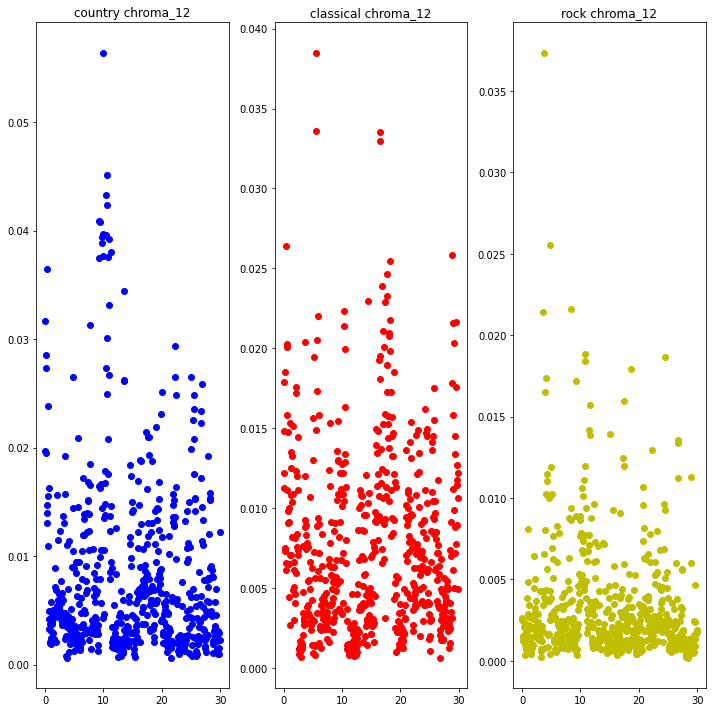

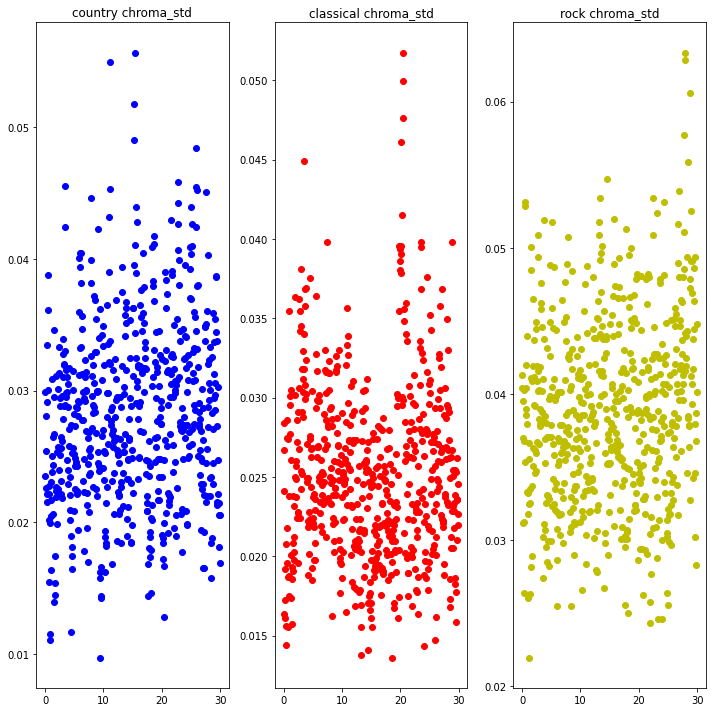

In [21]:
left, right = -10, 10
time = np.arange(0, duration-step, win)
for name in fn[:34]:

    y_axis_1 = container_1[fn.index(name), :] # single property for the whole song
    y_axis_2 = container_2[fn.index(name), :]
    y_axis_3 = container_3[fn.index(name), :]

    fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(10,10))
    axes[0].set_title(genre1 + " " + name)
    axes[1].set_title(genre2 + " " + name)
    axes[2].set_title(genre3 + " " + name)

    axes[0].plot(time, y_axis_1, "bo")
    axes[1].plot(time, y_axis_2, "ro")
    axes[2].plot(time, y_axis_3, "yo")

    # axes[0].set_ylim(left, right)
    # axes[1].set_ylim(left, right)
    # axes[2].set_ylim(left, right)
    fig.tight_layout()
